# Historical Trend of Top 10 Stocks

In [1]:
import plotly.offline as pyo
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
import pandas_datareader.data as web
from pandas import Series, DataFrame
import statsmodels.api as sm
from statsmodels import regression
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
pyo.init_notebook_mode()
import pandas as pd
import datetime
import pandas_datareader.data as web
from pandas import Series, DataFrame
import math
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.metrics import confusion_matrix
from datetime import timedelta,datetime
from datetime import date

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

/home/choobs96/anaconda3/lib/python3.7/site-packages/pandas_datareader/compat/__init__.py:7: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



Using TensorFlow backend.


In [2]:
historical=pd.read_csv('Historical_Price.csv',sep="|").drop(['Unnamed: 0'], axis=1)

In [3]:
historical

,Date,High,Low,Open,Close,Volume,Adj Close,Company Code KL
0,2014-01-15,3.21460,2.71796,2.89855,2.79923,73229619.0,2.323783,5249.KL
1,2014-01-16,2.81729,2.60057,2.79923,2.63669,49003730.0,2.188851,5249.KL
2,2014-01-20,2.75408,2.68184,2.71796,2.73602,19515133.0,2.271310,5249.KL
3,2014-01-21,2.70893,2.68184,2.69990,2.69990,13927056.0,2.241324,5249.KL
4,2014-01-22,2.71796,2.62766,2.69990,2.63669,25070650.0,2.188851,5249.KL
...,...,...,...,...,...,...,...,...
17239,2018-01-23,1.43000,1.42000,1.43000,1.43000,390300.0,1.430000,8206.KL
17240,2018-01-24,1.44000,1.42000,1.42000,1.43000,564100.0,1.430000,8206.KL
17241,2018-01-26,1.42000,1.41000,1.41000,1.42000,402200.0,1.420000,8206.KL
17242,2018-01-29,1.42000,1.41000,1.41000,1.41000,241700.0,1.410000,8206.KL


In [90]:
import plotly.express as px
df = historical
fig = px.line(df, x="Date", y="Close", color='Company Code KL')
fig.show()


In [5]:
#Based on this it is difficult to see the relationship between each stocks

# Deeper Analysis of the Data
To understand the relationship between the top 10 property stocks

In [6]:
start = datetime(2010, 1, 1)
end = datetime(2020, 5, 28)
dfcomp = web.DataReader(['5249.KL', '5288.KL', '8664.KL', '5200.KL', '1651.KL', '5606.KL',
       '5148.KL', '5053.KL', '3158.KL', '8206.KL'],'yahoo',start=start,end=end)['Adj Close']

In [7]:
klse=pd.read_csv('KLSE_PCT.csv').drop(['Unnamed: 0'], axis=1)

In [8]:
klse = klse.sort_values(by='Date')

In [9]:
from pandas.plotting import scatter_matrix
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import style

#Adjusting the siye of matplotlib
import matplotlib as mpl
mpl.rc('figure', figsize=(8,7))
mpl.__version__

#Adjusting the style of matplotlib
style.use('ggplot')


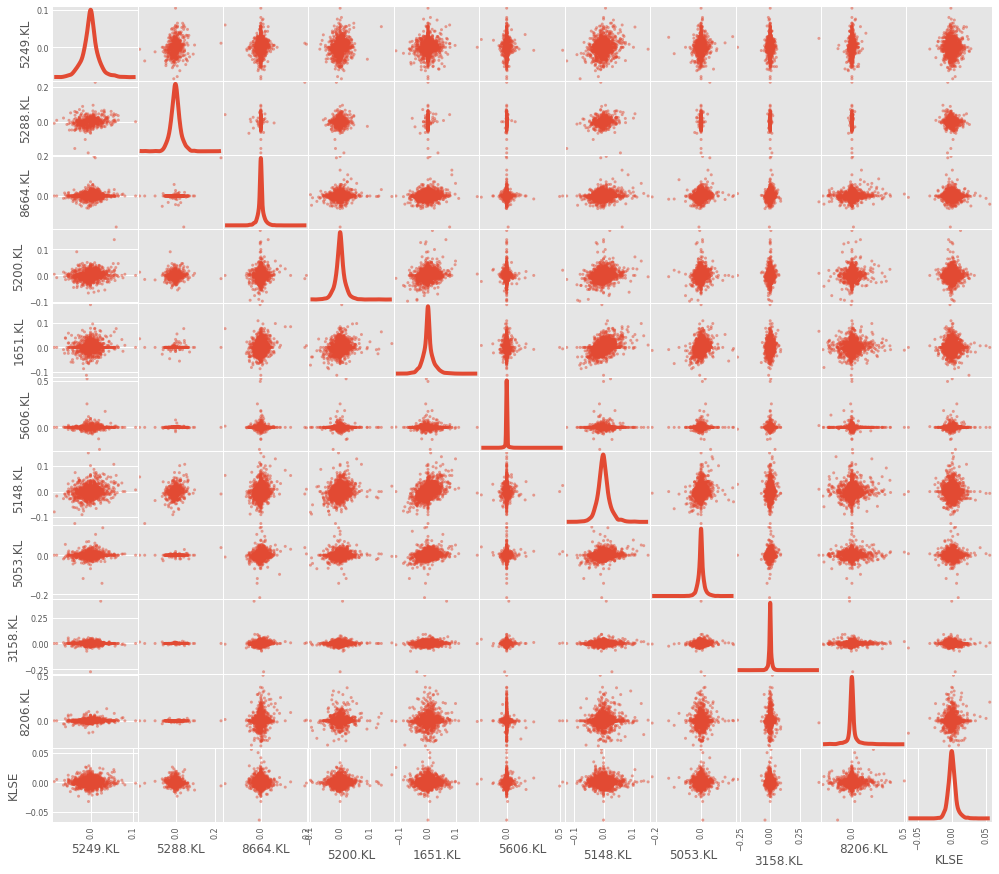

In [10]:
retscomp = dfcomp.pct_change()
retscomp=retscomp.reset_index()
retscomp['KLSE'] = klse['pct']
corr = retscomp.corr()
scatter_matrix(retscomp, diagonal='kde', figsize=(15, 15));

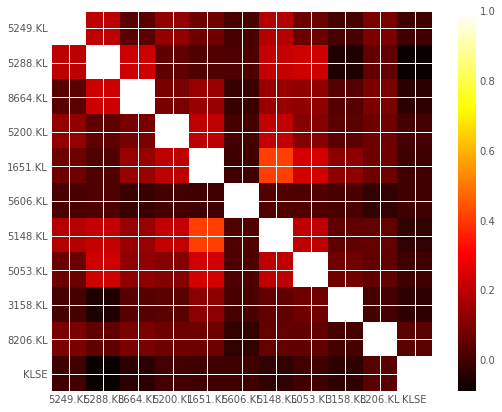

In [11]:
plt.imshow(corr, cmap='hot', interpolation='none')
plt.colorbar()
plt.xticks(range(len(corr)), corr.columns)
plt.yticks(range(len(corr)), corr.columns);

# By observing the correlation of stocks and KLSE index we can see that most of them has little correlation with the index. This is mostly due to the weightage of stock accounted in the KLSE index.
Therefore, an alternative method is used to analyse the stock. (Alpha and Beta analysis)

In [12]:
#Latest top 10 market cap share
top10=pd.read_csv('Property_Market_Cap.csv',sep = "|").drop(['Unnamed: 0'], axis=1)

In [13]:
top10

,Company Name,Company Code,Company Code KL,URL,Market Cap,Last Price,Price/Earning,Divident Yield,Return of Equity,Market Cap Float
0,IOIPG,5249,5249.KL,https://www.malaysiastock.biz/Corporate-Infoma...,5.947b,1.08,8.87,2.78,3.55,5.947000e+09
1,SIMEPROP,5288,5288.KL,https://www.malaysiastock.biz/Corporate-Infoma...,4.625b,0.68,13.31,4.41,3.62,4.625000e+09
2,SPSETIA,8664,8664.KL,https://www.malaysiastock.biz/Corporate-Infoma...,3.861b,0.96,11.14,1.05,2.87,3.861000e+09
3,UOADEV,5200,5200.KL,https://www.malaysiastock.biz/Corporate-Infoma...,3.541b,1.80,8.86,7.78,7.87,3.541000e+09
4,MRCB,1651,1651.KL,https://www.malaysiastock.biz/Corporate-Infoma...,2.471b,0.56,103.70,1.79,0.50,2.471000e+09
5,IGBB,5606,5606.KL,https://www.malaysiastock.biz/Corporate-Infoma...,2.221b,2.50,10.64,1.20,4.43,2.221000e+09
6,UEMS,5148,5148.KL,https://www.malaysiastock.biz/Corporate-Infoma...,2.178b,0.48,9.74,0.00,3.06,2.178000e+09
7,OSK,5053,5053.KL,https://www.malaysiastock.biz/Corporate-Infoma...,1.771b,0.85,4.45,5.92,7.84,1.771000e+09
8,YNHPROP,3158,3158.KL,https://www.malaysiastock.biz/Corporate-Infoma...,1.471b,2.78,34.88,0.00,3.62,1.471000e+09
9,ECOWLD,8206,8206.KL,https://www.malaysiastock.biz/Corporate-Infoma...,1.443b,0.49,6.98,0.00,4.53,1.443000e+09


In [14]:
top10_comp=list(top10['Company Code KL'])

In [15]:
klse=pd.read_csv('KLSE_Historical_data.csv',sep = "|").drop(['Unnamed: 0'], axis=1)
klse_col=['Date', 'Open_P', 'High_P', 'Low_P', 'Close_P', 'Adj_Close', 'Volume']
klse.columns = klse_col
def convert_date(i):
    month=i[:3]
    day=i[3:5]
    year=i[6:]
    output = year+'-'+month+'-'+day
    return output
klse['Date']=klse['Date'].apply(convert_date)
klse['Date']= pd.to_datetime(klse['Date'])
for i in klse_col:
    if i!='Date':
        klse[i]=klse[i].str.replace(',', '').replace('-', np.nan ).astype(float)
klse['pct']=klse['Adj_Close'].pct_change()
klse.to_csv("KLSE_PCT.csv")

In [22]:
def beta_stock(stock):
    import datetime



    start = datetime.datetime(2010, 1, 1)
    end = datetime.datetime(2020, 5, 28)
    
    df = web.DataReader(stock, 'yahoo', start, end)
    df.head()

    df3 = pd.read_csv('KLSE_PCT.csv')
    df3.set_index('Date', inplace=True)
    return_klse= df3[['pct']]
    return_s1 = df.Close.pct_change()[1:]
    df4=df3.reset_index()
    return_klse =df4[['Date','pct']]
    df['pct']=df['Adj Close'].pct_change()
    df5= df.reset_index()
    return_s1=df5[['Date','pct']]


    # Create traces
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=return_s1['Date'], y=return_s1['pct'],
                        text = "Stock1",
                        mode='lines',
                        name=stock))
    fig.add_trace(go.Scatter(x=return_klse['Date'], y=return_klse['pct'],
                        text = "KLSE",
                        mode='lines',
                        name='KLSE'))

    fig.show()


    return_klse_1 = return_klse.dropna()
    return_s1_1 = return_s1.dropna()
    return_klse_1['Date']=pd.to_datetime(return_klse_1['Date'])
    return_s1_1['Date'] = return_s1_1['Date'].apply(lambda x: datetime.date(x.year,x.month,x.day))
    return_klse_1['Date'] = return_klse_1['Date'].apply(lambda x: datetime.date(x.year,x.month,x.day))



    dates = list(return_s1_1['Date'])
    dates_2 = list(return_klse_1['Date'])

    def date_compare(x,y):
        mutual_dates = [] 
        if y>x:
            for i in y:
                if i in x:
                    mutual_dates.append(i)
        else:
            for i in x:
                if i in y:
                    mutual_dates.append(i)
        return mutual_dates

    final_date=(date_compare(dates,dates_2))
    min_date=min(final_date)
    max_date=max(final_date)

    return_klse_2=return_klse_1[return_klse_1['Date'].isin(final_date)]

    return_s1_2 = return_s1_1[return_s1_1['Date'].isin(final_date)]
    X = return_klse_2['pct'].values
    Y = return_s1_2['pct'].values
    def linreg(x,y):


        x = sm.add_constant(x)
        model = regression.linear_model.OLS(y,x).fit()

        # We are removing the constant
        x = x[:, 1]
        return model.params[0], model.params[1]


    alpha, beta = linreg(X,Y)
    print('alpha: ' + str(alpha))
    print('beta: ' + str(beta))
    return (stock,alpha,beta,min_date,max_date)

In [23]:
stock="5053.KL"

In [24]:
beta_stock(stock)

alpha: 0.00012325153627177338
beta: 0.05936713396384992


/home/choobs96/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/choobs96/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/choobs96/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentat

('5053.KL',
 0.00012325153627177338,
 0.05936713396384992,
 datetime.date(2010, 1, 5),
 datetime.date(2018, 1, 30))

In [25]:
top10_beta_klse=[]
for i in top10_comp:
    top10_beta_klse.append(beta_stock(i))

/home/choobs96/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/choobs96/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/choobs96/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentat

alpha: -0.0003758425930971199
beta: -0.09573471696285223


alpha: -0.0005703360974675483
beta: 0.03401220334434812


alpha: 0.0005787129207043463
beta: 0.0014806803041855915


alpha: 0.00023669923657038082
beta: -0.045510780564225535


alpha: 0.0003225456063647871
beta: -0.09106758253667648


alpha: 0.002481126877833472
beta: -0.27614063660841587


alpha: -0.00013761526905314305
beta: -0.00535983833437037


alpha: 0.0003872986928464892
beta: 0.05470208836771118


alpha: 0.0003396805624720069
beta: 0.11664377392913809


alpha: 0.003298116134990957
beta: 0.5256760869319953


In [26]:
output = pd.DataFrame(top10_beta_klse)

In [27]:
output.columns = ['Stock','Alpha','Beta','Start_Date','End_Date']

In [28]:
output['Date_diff'] = output['End_Date']-output['Start_Date']

In [29]:
latest=output.sort_values(['End_Date','Date_diff'],ascending=False).reset_index(drop=True)

In [30]:
latest

,Stock,Alpha,Beta,Start_Date,End_Date,Date_diff
0,5148.KL,-0.000138,-0.005360,2010-01-05,2020-03-12,3719 days
1,5200.KL,0.000237,-0.045511,2011-06-09,2020-03-12,3199 days
2,5249.KL,-0.000376,-0.095735,2014-01-16,2020-03-12,2247 days
3,5288.KL,-0.000570,0.034012,2017-12-01,2020-03-12,832 days
4,8664.KL,0.000579,0.001481,2010-01-05,2018-01-30,2947 days
5,1651.KL,0.000323,-0.091068,2010-01-05,2018-01-30,2947 days
6,5053.KL,0.000387,0.054702,2010-01-05,2018-01-30,2947 days
7,3158.KL,0.000340,0.116644,2010-01-05,2018-01-30,2947 days
8,8206.KL,0.003298,0.525676,2010-01-05,2018-01-30,2947 days
9,5606.KL,0.002481,-0.276141,2010-03-08,2018-01-30,2885 days


## Notes
Alpha shows how well (or badly) a stock has performed in comparison to a benchmark index.
Beta indicates how volatile a stock's price has been in comparison to the market as a whole.
A high alpha is always good.
A high beta may be preferred by an investor in growth stocks but shunned by investors who seek steady returns and lower risk.
An alpha of 1.0 means the investment outperformed its benchmark index by 1%.

There were some missing data for each stock. Default duration was set to be 10 years (2010-2019).
Only 5 stocks has the latest data while the remaining 5 has data point up till 2018-01-30.
Positive alpha is preferable while beta depends on the investor risk tolerance.

In [31]:
#Sort the Stocks by their Alpha and Beta
output.sort_values(['Alpha','Beta'],ascending=False).reset_index(drop=True)

,Stock,Alpha,Beta,Start_Date,End_Date,Date_diff
0,8206.KL,0.003298,0.525676,2010-01-05,2018-01-30,2947 days
1,5606.KL,0.002481,-0.276141,2010-03-08,2018-01-30,2885 days
2,8664.KL,0.000579,0.001481,2010-01-05,2018-01-30,2947 days
3,5053.KL,0.000387,0.054702,2010-01-05,2018-01-30,2947 days
4,3158.KL,0.000340,0.116644,2010-01-05,2018-01-30,2947 days
5,1651.KL,0.000323,-0.091068,2010-01-05,2018-01-30,2947 days
6,5200.KL,0.000237,-0.045511,2011-06-09,2020-03-12,3199 days
7,5148.KL,-0.000138,-0.005360,2010-01-05,2020-03-12,3719 days
8,5249.KL,-0.000376,-0.095735,2014-01-16,2020-03-12,2247 days
9,5288.KL,-0.000570,0.034012,2017-12-01,2020-03-12,832 days


1) Avoid Alpha negative stock
2) Depending on Market performance:
    a) Good market - Sell Negative Beta stocks and Buy Positive Beta stocks
    b) Bad market - Buy Negative Beta stocks and Sell Positive Beta stocks

In [32]:
fig = go.Figure()
fig = px.scatter(x=output["Alpha"], y=output['Beta'],text=output['Stock'])
fig.update_traces(textposition='top center')
fig.add_shape(
        # Line Diagonal
            type="line",
            x0=min(output['Alpha']),
            y0=0,
            x1=max(output['Alpha']),
            y1=0,
            opacity=0.5,
            line=dict(
                color="Green",
                width=3,
                dash="solid"
            )
)
fig.add_shape(
        # Line Diagonal
            type="line",
            x0=0,
            y0=min(output['Beta']),
            x1=0,
            y1=max(output['Beta']),
            opacity=0.5,
            line=dict(
                color="Red",
                width=3,
                dash="solid"
            )
)

fig.update_layout(
    height=800,
    title="Alpha Beta Chart",
    xaxis_title="Alpha",
    yaxis_title="Beta",
)
fig.show()


## In this case, we should avoid (5288.KL,5248.KL and 5249.KL)
Depending on the market condition we can choose to go for a positive/negative beta

In [33]:
list(latest['Stock'].head(4))

['5148.KL', '5200.KL', '5249.KL', '5288.KL']

# Prediction based on historical data

In [34]:
# def close_price(stock):
#     start = datetime.datetime(2010, 1, 1)
#     end = datetime.datetime(2020, 5, 29)

#     df = web.DataReader(stock, 'yahoo', start, end)
#     df.tail()
#     plt.figure(figsize=(16,8))
#     plt.title('Close Price History')
#     plt.plot(df['Close'])
#     plt.xlabel('Date',fontsize=18)
#     plt.ylabel('Close Price RM',fontsize=18)
#     plt.show()

Epoch 1/1
1672/1672 [==============================] - 46s 27ms/step - loss: 0.0034


/home/choobs96/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:76: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



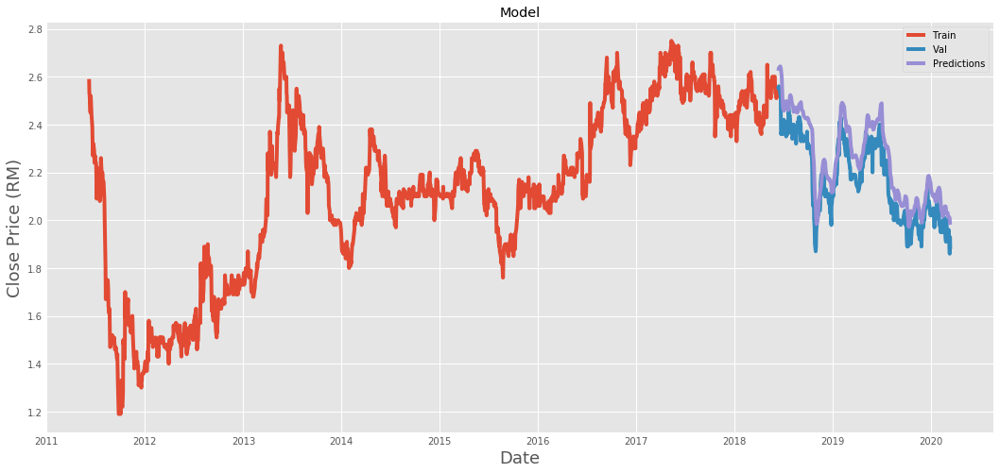

            Close  Predictions
Date                          
2018-06-12   2.56     2.624904
2018-06-13   2.55     2.630661
2018-06-14   2.56     2.635674
2018-06-18   2.54     2.641634
2018-06-19   2.53     2.643339
...           ...          ...
2020-03-06   1.96     2.010474
2020-03-09   1.89     2.011981
2020-03-10   1.86     2.003668
2020-03-11   1.93     1.987302
2020-03-12   1.88     1.981068

[432 rows x 2 columns]


In [65]:
stock = "5200.KL"
start = datetime(2010, 1, 1)
end = datetime(2020, 5, 28)

df = web.DataReader(stock, 'yahoo', start, end)

#Create a new dataframe with only the 'Close' column
data = df.filter(['Close'])

#Converting the dataframe to a numpy array
dataset = data.values

#Get /Compute the number of rows to train the model on
training_data_len = math.ceil( len(dataset) *.8) 

#Scale the all of the data to be values between 0 and 1 
scaler = MinMaxScaler(feature_range=(0, 1)) 
scaled_data = scaler.fit_transform(dataset)

#Create the scaled training data set 
train_data = scaled_data[0:training_data_len  , : ]

#Split the data into x_train and y_train data sets
x_train=[]
y_train = []
for i in range(60,len(train_data)):
    x_train.append(train_data[i-60:i,0])
    y_train.append(train_data[i,0])

#Convert x_train and y_train to numpy arrays
x_train, y_train = np.array(x_train), np.array(y_train)

#Reshape the data into the shape accepted by the LSTM
x_train = np.reshape(x_train, (x_train.shape[0],x_train.shape[1],1))

#Build the LSTM network model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True,input_shape=(x_train.shape[1],1)))
model.add(LSTM(units=50, return_sequences=False))
model.add(Dense(units=25))
model.add(Dense(units=1))

#Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

#Train the model
model.fit(x_train, y_train, batch_size=1, epochs=1)

#Test data set
test_data = scaled_data[training_data_len - 60: , : ]
#Create the x_test and y_test data sets
x_test = []
y_test =  dataset[training_data_len : , : ] #Get all of the rows from index 1603 to the rest and all of the columns (in this case it's only column 'Close'), so 2003 - 1603 = 400 rows of data
for i in range(60,len(test_data)):
    x_test.append(test_data[i-60:i,0])

#Convert x_test to a numpy array 
x_test = np.array(x_test)

#Reshape the data into the shape accepted by the LSTM
x_test = np.reshape(x_test, (x_test.shape[0],x_test.shape[1],1))

#Getting the models predicted price values
predictions = model.predict(x_test) 
predictions = scaler.inverse_transform(predictions)#Undo scaling

#Calculate/Get the value of RMSE
rmse=np.sqrt(np.mean(((predictions- y_test)**2)))
rmse

data.tail()

#Plot/Create the data for the graph
train = data[:training_data_len]
valid = data[training_data_len:]
valid['Predictions'] = predictions
#Visualize the data
plt.figure(figsize=(16,8))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price (RM)', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.legend(['Train', 'Val', 'Predictions'], loc='upper right')
plt.show()
print(valid)

In [66]:
#Since there are missing data for Malaysian stock, the model is inaccurate.

In [67]:
#Get the quote
apple_quote = web.DataReader(stock, data_source='yahoo', start='2010-01-01', end=date.today()-timedelta(1))
#Create a new dataframe
new_df = apple_quote.filter(['Close'])

#Get teh last 60 day closing price 
last_n_days = new_df[-60:].values
#Scale the data to be values between 0 and 1
last_n_days_scaled = scaler.transform(last_n_days)
#Create an empty list
X_test = []
#Append teh past 60 days
X_test.append(last_n_days_scaled)
#Convert the X_test data set to a numpy array
X_test = np.array(X_test)
#Reshape the data
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
#Get the predicted scaled price
pred_price = model.predict(X_test)
#undo the scaling 
pred_price = scaler.inverse_transform(pred_price)
print("Today's price is "+str(pred_price))

Today's price is [[1.9720017]]


In [68]:
#Get the quote
apple_quote2 = web.DataReader(stock, data_source='yahoo', start=date.today(), end=date.today())
print(apple_quote2['Close'])

Date
2020-05-29    1.8
Name: Close, dtype: float64


# Stock price prediction Linear Regression & Support vector regressor

In [69]:
import numpy as np 
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split

In [70]:
stock = '5200.KL'
df = web.DataReader(stock, data_source='yahoo', start='2010-01-01', end='2020-03-12')

In [71]:
df=df[['Adj Close']]

In [72]:
print(df.head())

            Adj Close
Date                 
2011-06-08   1.600831
2011-06-09   1.563745
2011-06-10   1.557565
2011-06-13   1.514299
2011-06-14   1.557565


In [73]:
# A variable for predicting 'n' days out into the future
forecast_out = 30 #'n=30' days
#Create another column (the target ) shifted 'n' units up
df['Prediction'] = df[['Adj Close']].shift(-forecast_out)
#print the new data set
print(df.tail())

            Adj Close  Prediction
Date                             
2020-03-06       1.96         NaN
2020-03-09       1.89         NaN
2020-03-10       1.86         NaN
2020-03-11       1.93         NaN
2020-03-12       1.88         NaN


In [74]:
### Create the independent data set (X)  #######
# Convert the dataframe to a numpy array
X = np.array(df.drop(['Prediction'],1))

#Remove the last '30' rows
X = X[:-forecast_out]
print(X)

[[1.60083055]
 [1.5637455 ]
 [1.55756462]
 ...
 [2.04999995]
 [2.05999994]
 [2.03999996]]


In [75]:
### Create the dependent data set (y)  #####
# Convert the dataframe to a numpy array 
y = np.array(df['Prediction'])
# Get all of the y values except the last '30' rows
y = y[:-forecast_out]
print(y)

[1.29797053 1.34741712 1.3968637  ... 1.86000001 1.92999995 1.88      ]


In [76]:
# Split the data into 80% training and 20% testing
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [77]:
# Create and train the Support Vector Machine (Regressor) 
svr_rbf = SVR(kernel='rbf', C=1e3, gamma=0.1) 
svr_rbf.fit(x_train, y_train)

SVR(C=1000.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.1,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [78]:
# Testing Model: Score returns the coefficient of determination R^2 of the prediction. 
# The best possible score is 1.0
svm_confidence = svr_rbf.score(x_test, y_test)
print("svm confidence: ", svm_confidence)

svm confidence:  0.9207605573401034


In [79]:
# Create and train the Linear Regression  Model
lr = LinearRegression()
# Train the model
lr.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [80]:
# Testing Model: Score returns the coefficient of determination R^2 of the prediction. 
# The best possible score is 1.0
lr_confidence = lr.score(x_test, y_test)
print("lr confidence: ", lr_confidence)

lr confidence:  0.9173561394406681


In [81]:
# Set x_forecast equal to the last 30 rows of the original data set from Adj. Close column
x_forecast = np.array(df.drop(['Prediction'],1))[-forecast_out:]
print(x_forecast)

[[1.98000002]
 [1.99000001]
 [1.96000004]
 [1.95000005]
 [1.95000005]
 [1.96000004]
 [1.95000005]
 [1.95000005]
 [1.95000005]
 [1.95000005]
 [2.        ]
 [1.99000001]
 [1.99000001]
 [1.98000002]
 [2.00999999]
 [1.96000004]
 [1.91999996]
 [1.90999997]
 [1.98000002]
 [2.        ]
 [1.95000005]
 [1.91999996]
 [1.95000005]
 [1.91999996]
 [1.95000005]
 [1.96000004]
 [1.88999999]
 [1.86000001]
 [1.92999995]
 [1.88      ]]


In [82]:
# Print linear regression model predictions for the next '30' days
lr_prediction = lr.predict(x_forecast)
print(lr_prediction)
# Print support vector regressor model predictions for the next '30' days
svm_prediction = svr_rbf.predict(x_forecast)
print(svm_prediction)

[1.97569492 1.98524921 1.95658634 1.94703205 1.94703205 1.95658634
 1.94703205 1.94703205 1.94703205 1.94703205 1.9948035  1.98524921
 1.98524921 1.97569492 2.00435779 1.95658634 1.91836907 1.90881478
 1.97569492 1.9948035  1.94703205 1.91836907 1.94703205 1.91836907
 1.94703205 1.95658634 1.8897062  1.86104333 1.92792336 1.88015191]
[2.01777193 2.02621089 2.000491   1.99165627 1.99165627 2.000491
 1.99165627 1.99165627 1.99165627 1.99165627 2.0345107  2.02621089
 2.02621089 2.01777193 2.0426677  2.000491   1.96441821 1.95510628
 2.01777193 2.0345107  1.99165627 1.96441821 1.99165627 1.96441821
 1.99165627 2.000491   1.93615497 1.90696269 1.97361622 1.92652271]


In [83]:
len(svm_prediction)

30

In [84]:
df=df.reset_index()

In [85]:
df=df.append(pd.DataFrame({'Date': pd.date_range(start=df.Date.iloc[-1], periods=31, freq='D', closed='right')}))

In [86]:
df['SVM_Prediction']=np.nan
df['LR_Prediction']=np.nan

In [87]:
df['LR_Prediction'].iloc[-30:]=lr_prediction
df['SVM_Prediction'].iloc[-30:]=svm_prediction

/home/choobs96/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [88]:
df.tail(30)

,Date,Adj Close,Prediction,SVM_Prediction,LR_Prediction
0,2020-03-13,NaN,NaN,2.017772,1.975695
1,2020-03-14,NaN,NaN,2.026211,1.985249
2,2020-03-15,NaN,NaN,2.000491,1.956586
3,2020-03-16,NaN,NaN,1.991656,1.947032
4,2020-03-17,NaN,NaN,1.991656,1.947032
5,2020-03-18,NaN,NaN,2.000491,1.956586
6,2020-03-19,NaN,NaN,1.991656,1.947032
7,2020-03-20,NaN,NaN,1.991656,1.947032
8,2020-03-21,NaN,NaN,1.991656,1.947032
9,2020-03-22,NaN,NaN,1.991656,1.947032


In [89]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['Date'], y=df['Adj Close'],
                    mode='lines',
                    name='lines'))
fig.add_trace(go.Scatter(x=df['Date'], y=df['LR_Prediction'],
                    mode='lines',
                    name='LR'))
fig.add_trace(go.Scatter(x=df['Date'], y=df['SVM_Prediction'],
                    mode='lines', name='SVM'))